# Using Kmeans for customer segmentation 

In [1]:
import pandas as pd 

In [2]:
clean_df =pd.read_csv('final_data.csv')

In [5]:
clean_df.drop(columns=('Unnamed: 0'),inplace=True)

In [77]:
clean_df.set_index('customer_id', inplace = True)

In [78]:
clean_df.drop(columns=('class'), inplace=True)

In [128]:
clean_df.drop(columns=('item_id'),inplace = True)

In [269]:
clean_df.drop(columns=('quantity'),inplace = True)

In [270]:
clean_df

,selling_price,other_discount,coupon_discount,age_range,marital_status,rented,family_size,no_of_children,income_bracket,brand_type,redemption_status,campaign_type,class
customer_id,,,,,,,,,,,,,
857,59.84,0.00,0.0,6,0.0,0,1,0,7,1,0.0,1,2
857,59.84,0.00,0.0,6,0.0,0,1,0,7,1,0.0,1,2
857,59.84,0.00,0.0,6,0.0,0,1,0,7,1,0.0,1,2
857,59.84,0.00,0.0,6,0.0,0,1,0,7,1,0.0,1,2
857,59.84,0.00,0.0,6,0.0,0,1,0,7,1,0.0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1492,89.05,-17.45,0.0,4,1.0,1,2,0,3,1,0.0,1,2
1492,89.05,-17.45,0.0,4,1.0,1,2,0,3,1,0.0,1,2
1492,89.05,-17.45,0.0,4,1.0,1,2,0,3,1,0.0,1,2


In [272]:
import plotly.express as px
import hvplot.pandas
from sklearn.cluster import KMeans

# using the eblow curve to figure out how many clusters we need 

inertia = []
k = list(range(1, 11))

# Calculate the inertia for the range of k values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(clean_df)
    inertia.append(km.inertia_)

# Create the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve")

:Curve   [k]   (inertia)

In [273]:
# function that returns a new df 
def get_clusters(k, data):
    # Initialize the K-Means model
    model = KMeans(n_clusters=k, random_state=1)

    # Fit the model
    model.fit(data)

    # Predict clusters
    predictions = model.predict(data)

    # Create return DataFrame with predicted clusters
    data["class"] = model.labels_

    return data

In [275]:
kmeans_df = get_clusters(3,clean_df)

In [276]:
# looking to see how many clusters we have 
kmeans_df['class'].unique()

array([0, 1, 2], dtype=int32)

In [277]:
kmeans_df.columns

Index(['selling_price', 'other_discount', 'coupon_discount', 'age_range',
       'marital_status', 'rented', 'family_size', 'no_of_children',
       'income_bracket', 'brand_type', 'redemption_status', 'campaign_type',
       'class'],
      dtype='object')

In [132]:
# Plotting the 2D-Scatter with x="Annual Income" and y="Spending Score (1-100)"
#kmeans_df.hvplot.scatter(x="redemption_status", y="selling_price", by="class")

In [279]:
# Plotting the clusters with three features
fig = px.scatter_3d(
   kmeans_df,
    x="income_bracket",
    y="age_range",
    z="selling_price",
    color="class",
    symbol="class",
    width=800,
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()

# Using PCA analysis 

In [280]:
### PCA ANALYSIS
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [281]:
# scaling the data 
scaled = StandardScaler().fit_transform(clean_df)

In [283]:
# Creating the PCA instance
#n_components = 16 for the number of columns
pca = PCA(n_components=13)
principalComponents = pca.fit_transform(scaled)

([<matplotlib.axis.XTick at 0x7f95d2969130>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

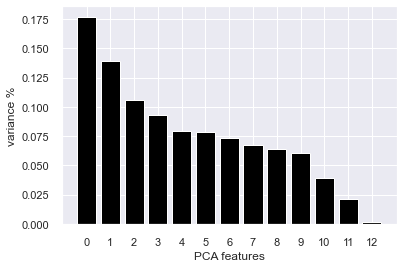

In [284]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)

In [286]:
# Save components to a DataFrame to be able to plot 
PCA_components = pd.DataFrame(
    data = principalComponents,
    columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13'])
PCA_components

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,PCA13
0,-2.168593,-0.277156,-1.344440,-0.041473,0.036887,-0.142584,-0.619973,0.125134,-0.020435,-0.417050,2.058005,-0.048543,-0.126053
1,-2.168593,-0.277156,-1.344440,-0.041473,0.036887,-0.142584,-0.619973,0.125134,-0.020435,-0.417050,2.058005,-0.048543,-0.126053
2,-2.168593,-0.277156,-1.344440,-0.041473,0.036887,-0.142584,-0.619973,0.125134,-0.020435,-0.417050,2.058005,-0.048543,-0.126053
3,-2.168593,-0.277156,-1.344440,-0.041473,0.036887,-0.142584,-0.619973,0.125134,-0.020435,-0.417050,2.058005,-0.048543,-0.126053
4,-2.168593,-0.277156,-1.344440,-0.041473,0.036887,-0.142584,-0.619973,0.125134,-0.020435,-0.417050,2.058005,-0.048543,-0.126053
...,...,...,...,...,...,...,...,...,...,...,...,...,...
261193,-1.323566,-0.405271,1.168512,1.199556,-0.005848,-0.370246,-0.855522,-1.720159,3.043501,0.151088,-0.451425,0.027842,-0.059709
261194,-1.323566,-0.405271,1.168512,1.199556,-0.005848,-0.370246,-0.855522,-1.720159,3.043501,0.151088,-0.451425,0.027842,-0.059709
261195,-1.323566,-0.405271,1.168512,1.199556,-0.005848,-0.370246,-0.855522,-1.720159,3.043501,0.151088,-0.451425,0.027842,-0.059709
261196,-1.323566,-0.405271,1.168512,1.199556,-0.005848,-0.370246,-0.855522,-1.720159,3.043501,0.151088,-0.451425,0.027842,-0.059709


Text(0.5, 1.0, 'Components with the Highest Variance')

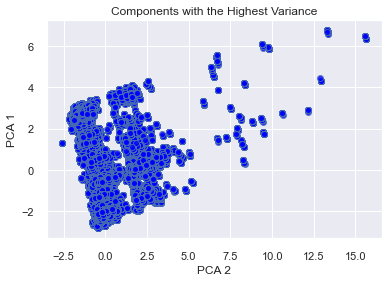

In [288]:
# plotting two features 
plt.scatter(x=PCA_components['PCA2'], y=PCA_components['PCA1'], alpha=.8, edgecolors='b', c=['blue'])
plt.xlabel('PCA 2')
plt.ylabel('PCA 1')
plt.title("Components with the Highest Variance")

Text(0.5, 1.0, 'PCA 10 VS. PCA 11')

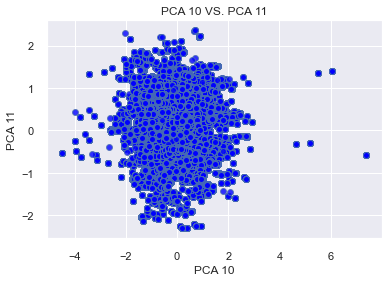

In [289]:
# exploring with visualizations 
plt.scatter(x=PCA_components['PCA10'], y=PCA_components['PCA11'], alpha=.8, edgecolors='b', c=['blue'])
plt.xlabel('PCA 10')
plt.ylabel('PCA 11')
plt.title("PCA 10 VS. PCA 11")

In [291]:
# getting the variance ratios for the top 3 components
pca_result = pca.fit_transform(PCA_components.values)
PCA_components['PCA1'] = pca_result[:,0]
PCA_components['PCA2'] = pca_result[:,1] 
PCA_components['PCA3'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.17698578 0.13915935 0.10615083 0.09290843 0.07918511 0.07835257
 0.07349246 0.06774885 0.0642532  0.0602625  0.03957008 0.02079451
 0.00113634]


In [292]:
import seaborn as sns 

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

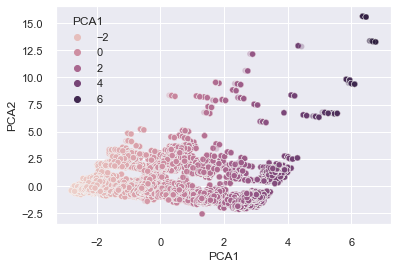

In [293]:
# exploring with different plots to derive insights 
sns.scatterplot(
    x="PCA1", y="PCA2",
    hue="PCA1",
    data=PCA_components,
    legend="auto",
    alpha=0.3
)

## Using siloutette scoring to access the quality of the Kmeans clusters 

In [294]:
# Initialize the K-Means model
new_model = KMeans(n_clusters=3, random_state=1)
# Fit the model
new_model.fit(clean_df)

KMeans(n_clusters=3, random_state=1)

In [297]:
# Calculate Silhoutte Score
from sklearn import metrics
#from sklearn.metrics import silhouette_score

labels = new_model.labels_

In [296]:
score = metrics.silhouette_score(clean_df,labels, metric='euclidean')

In [311]:
# as the clusters become more defined the score increases closer to 1 
print(f'This is the silouette score based on using 3 clusters: {score}')

This is the silouette score based on using 3 clusters: 0.6466206483022968


In [300]:
# running the silouette score using 4 clusters 
model_4k = KMeans(n_clusters=4, random_state=1)
# Fit the model
model_4k.fit(clean_df)

KMeans(n_clusters=4, random_state=1)

In [302]:
labels = model_4k.labels_

In [303]:
score_4k = metrics.silhouette_score(clean_df,labels, metric='euclidean')

In [304]:
score_4k

0.4858924225533503

In [305]:
# running the silouette score using 2 clusters 
model_2k = KMeans(n_clusters=2, random_state=1)
# Fit the model
model_2k.fit(clean_df)

KMeans(n_clusters=2, random_state=1)

In [306]:
labels = model_2k.labels_
score_2k = metrics.silhouette_score(clean_df,labels, metric='euclidean')

In [308]:
score_2k

0.9222464210912588